In [ ]:
!pip install torch numpy matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 135.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 97.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 120.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitl

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import torch
import torch.nn as nn

# Transitioning from Simple to Complex Distributions via Step-by-Step Transformation

In diffusion models, DDPM and its subsequent variants can be understood as a process of transforming a simple distribution ($\mathcal{N}(0, I)$) into a more complex one. Unlike VAEs or Normalizing Flows, diffusion models achieve this through a gradual, step-by-step process. VAEs and Flows attempt to learn the transformation either in a single step.

Given a complex distribution $x = x_0 \sim p_0$ and a simple distribution $z = x_T \sim p_T = \mathcal{N}(0, I)$, the entire process can be described as:

$$
x = x_0 \rightarrow x_1 \rightarrow x_2 \rightarrow \ldots \rightarrow x_{T-1} \rightarrow x_T = z
$$

We define the forward process as:

$$
x_t = \alpha_t x_{t-1} + \beta_t \epsilon_t,\quad \epsilon_t \sim \mathcal{N}(0, I)
$$

where $\alpha_t, \beta_t > 0$ and $\alpha_t^2 + \beta_t^2 = 1$.

Due to properties of Gaussian distributions, we can express:

$$
x_t = \overline{\alpha}_t x_0 + \overline{\beta}_t \epsilon,\quad \epsilon \sim \mathcal{N}(0, I)
$$

where:

- $\overline{\alpha}_t = \alpha_t \cdots \alpha_1$
- $\overline{\beta}_t = \sqrt{1 - \overline{\alpha}_t^2}$

If we choose suitable values for $\alpha_1, \ldots, \alpha_T$ such that $\overline{\alpha}_T \approx 0$, then the final $x_T$ will approximately follow a simple Gaussian distribution.

On the other hand, if we make each $\beta_t$ sufficiently small, we can expect to learn the reverse process $x_t \to x_{t-1}$, thus enabling transformation from the simple distribution back to the complex one.

For instance, set $T = 1000$ and define the schedule:

$$
\alpha_t = \sqrt{1 - \frac{0.02t}{T}}
$$

You may also experiment with other scheduling strategies.


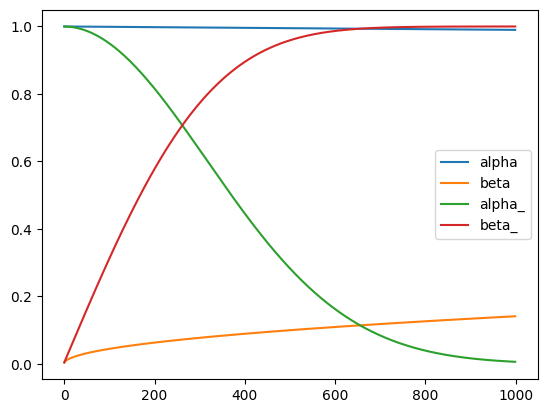

In [ ]:
T = 1000
beta = np.sqrt(0.02 * np.arange(1, T + 1) / T)
alpha = np.sqrt(1 - np.square(beta))
alpha_ = np.cumprod(alpha)
beta_ = np.sqrt(1 - np.square(alpha_))

plt.plot(alpha, label='alpha')
plt.plot(beta, label='beta')
plt.plot(alpha_, label='alpha_')
plt.plot(beta_, label='beta_')
plt.legend()
plt.show()

# Example: Mixture of Gaussians

We define a data distribution $p_0 = \frac{1}{n} \sum_{i=1}^n \mathcal{N}(\mu_i, \sigma_i^2)$, which is a mixture of $n$ two-dimensional Gaussian distributions.

The following code demonstrates the **forward process** from $p_0$ to a standard normal distribution.

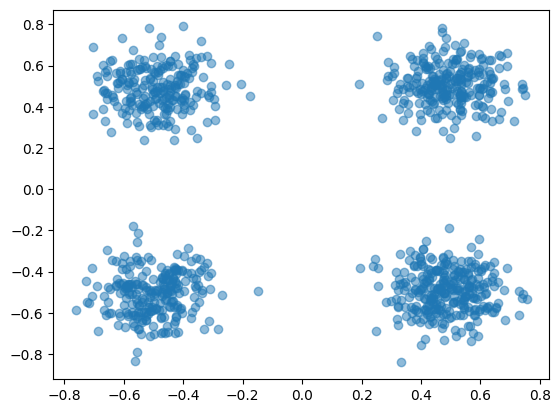

In [ ]:
mu = np.array([[0.5, 0.5], [0.5, -0.5], [-0.5, 0.5], [-0.5, -0.5]])
sigma = np.array([0.1, 0.1, 0.1, 0.1])

def sample_from_p0(size):
    eps = np.random.randn(*size, 2)
    gaussian_id = np.random.randint(0, mu.shape[0], size)
    return mu[gaussian_id] + sigma[gaussian_id][..., None] * eps

def sample_from_pT(size):
    return np.random.randn(*size, 2)

data = sample_from_p0((1000, ))
plt.scatter(data[:, 0], data[:, 1], alpha=0.5)
plt.show()

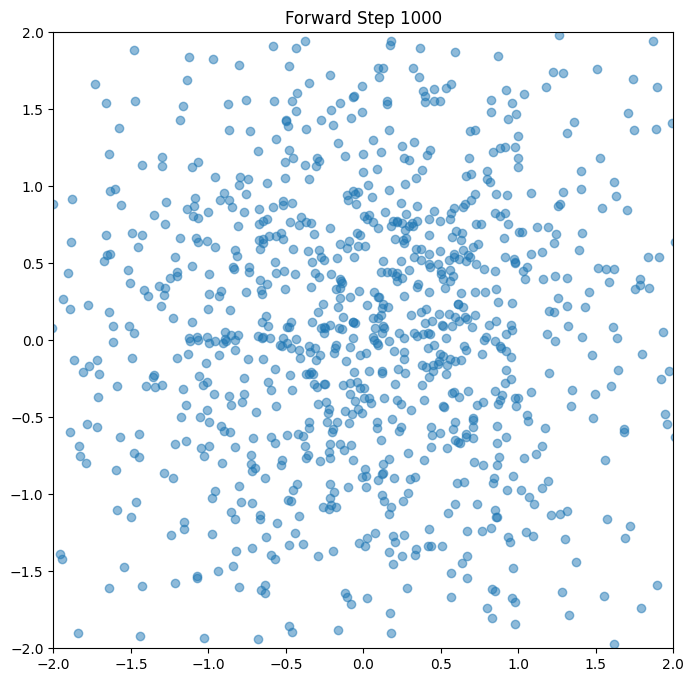

In [ ]:
def forward_step(x, t):
    return alpha[t] * x + beta[t] * np.random.randn(*x.shape)

x_init = sample_from_p0((1000, ))
substep = 25

fig, ax = plt.subplots(figsize=(8, 8))
x = x_init.copy()
scat = ax.scatter(x[:, 0], x[:, 1], alpha=0.5)
ax.set_xlim(-2, 2)
ax.set_ylim(-2, 2)

def update(frame):
    global x
    for i in range(substep):
        x = forward_step(x, frame * substep + i)
    scat.set_offsets(x)
    ax.set_title(f"Forward Step {(frame + 1) * substep}")
    return scat,

# 创建动画
ani = FuncAnimation(fig, update, frames=T // substep, blit=True)
HTML(ani.to_jshtml())

# Training the Reverse Process of a Diffusion Model

Given the noise at each step $\epsilon_t$, the reverse process can be written as:

$$
x_{t-1} = \frac{1}{\alpha_t}(x_t - \beta_t \epsilon_t)
$$

This motivates us to design a neural network $\epsilon_\theta$ to approximate $\epsilon_t$. We want to predict $\epsilon_t$ given $t$ and $x_t$, with the objective:

$$
\left\| x_{t-1} - \frac{1}{\alpha_t}(x_t - \beta_t \epsilon_\theta(x_t, t)) \right\|^2 = \frac{\beta_t^2}{\alpha_t^2} \left\| \epsilon_t - \epsilon_\theta(x_t, t) \right\|^2
$$

where $x_t = \overline{\alpha}_t x_0 + \overline{\beta}_t \overline{\epsilon}_t$, and $\overline{\epsilon}_t \sim \mathcal{N}(0, I)$.

We can further simplify the objective as:

$$
\frac{\beta_t^2}{\alpha_t^2} \left\| \epsilon_t - \epsilon_\theta(\underline{\overline{\alpha}_t x_0 + \alpha_t \overline{\beta}_t \overline{\epsilon}_{t-1} + \beta_t \epsilon_t}, t) \right\|^2
$$

Thus, the training procedure consists of the following steps:

1. Sample $x_0$
2. Randomly sample $t$ from $\{1, \ldots, T\}$
3. Sample $\epsilon_t$ and $\overline{\epsilon}_{t-1}$ from a standard normal distribution
4. Train using the objective function above

**Note**: In practice, due to the number of random variables, training becomes difficult. To mitigate this, we use a trick to reduce $\epsilon_t$ and $\overline{\epsilon}_{t-1}$ to a single variable. See `loss_fn_2`.

In [ ]:
class ConditionalModel(nn.Module):
    def __init__(self, dim, T):
        super(ConditionalModel, self).__init__()
        self.T = T
        self.net = nn.Sequential(
            nn.Linear(dim + 1, 128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, dim)
        )

    def forward(self, x, t):
        inputs = torch.cat([x, t[..., None].float() / T], dim=-1)
        return self.net(inputs)

Epoch 0, Loss: 1.2953
Epoch 1000, Loss: 0.1068
Epoch 2000, Loss: 0.1250
Epoch 3000, Loss: 0.1520
Epoch 4000, Loss: 0.1962
Epoch 5000, Loss: 0.1613
Epoch 6000, Loss: 0.2091
Epoch 7000, Loss: 0.1227
Epoch 8000, Loss: 0.1889
Epoch 9000, Loss: 0.0886


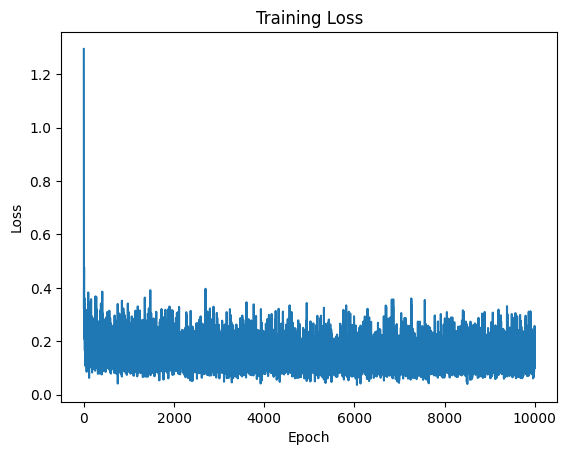

In [ ]:
eps_net = ConditionalModel(2, T)
optimizer = torch.optim.Adam(eps_net.parameters(), lr=1e-3)
batch_size = 64

alpha_tensor = torch.tensor(alpha, dtype=torch.float32)
beta_tensor = torch.tensor(beta, dtype=torch.float32)
alpha_tensor_ = torch.tensor(alpha_, dtype=torch.float32)
beta_tensor_ = torch.tensor(beta_, dtype=torch.float32)

def loss_fn_1(x0, eps_t, eps_t_minus_1_, t):
    xt = alpha_tensor_[t][:, None] * x0 + alpha_tensor[t][:, None] * beta_tensor_[t][:, None] * eps_t_minus_1_ + beta_tensor[t][:, None] * eps_t
    eps_pred = eps_net(xt, t)
    loss = torch.mean((eps_t - eps_pred) ** 2)
    return loss

def loss_fn_2(x0, eps_t, eps_t_minus_1_, t):
    eps_pred = eps_net(alpha_tensor_[t][:, None] * x0 + beta_tensor_[t][:, None] * eps_t, t)
    loss = torch.mean((eps_t - beta_tensor_[t][:, None] * eps_pred / beta_tensor[t][:, None]) ** 2)
    return loss

def train_step():
    optimizer.zero_grad()
    x0 = torch.tensor(sample_from_p0((batch_size, )), dtype=torch.float32)
    t = torch.randint(0, T, (batch_size, ), dtype=torch.long)
    eps_t = torch.randn_like(x0)
    eps_t_minus_1_ = torch.randn_like(x0)

    loss = loss_fn_2(x0, eps_t, eps_t_minus_1_, t)
    loss.backward()
    optimizer.step()
    return loss.item()

# Training loop
num_epochs = 10000
losses = []
for epoch in range(num_epochs):
    loss = train_step()
    losses.append(loss)
    if epoch % 1000 == 0:
        print(f"Epoch {epoch}, Loss: {loss:.4f}")
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

# Reverse Process

We now consider the reverse process to generate samples from the target distribution. As discussed earlier, the reverse step is ideally:

$$
\frac{1}{\alpha_t}(x_t - \beta_t \epsilon_\theta(x_t, t))
$$

However, in practice, we usually add a noise term similar to the forward process. This can be understood by analogy with techniques in autoregressive generation models such as **teacher forcing**, **greedy search**, and **random sampling**. For a detailed derivation, refer to related papers.

The modified reverse step becomes:

$$
\frac{1}{\alpha_t}(x_t - \beta_t \epsilon_\theta(x_t, t)) + \sigma_t z,\quad z \sim \mathcal{N}(0, I)
$$

Typically, we set $\sigma_t = \beta_t$.


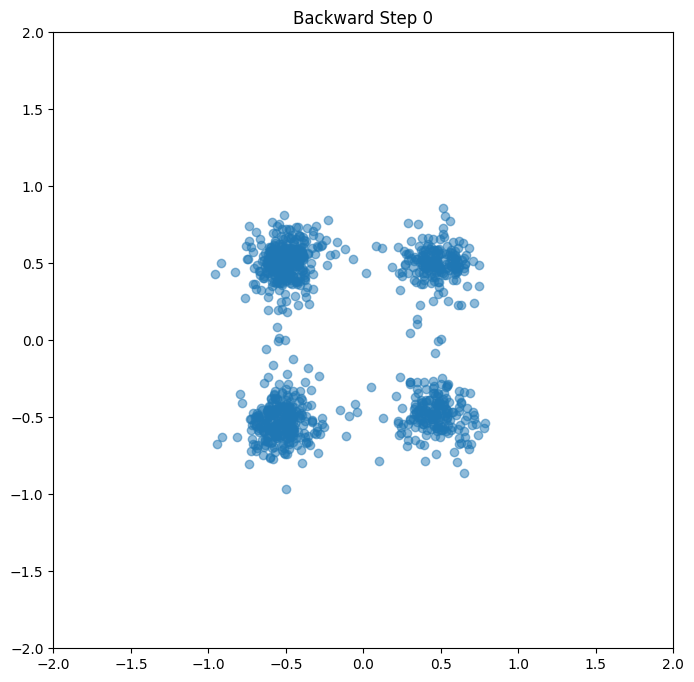

In [ ]:
def backward_step(x, t):
    x_tensor = torch.tensor(x, dtype=torch.float32)
    t_tensor = torch.tensor(t, dtype=torch.long).unsqueeze(0).expand_as(x_tensor[:, 0])
    eps_pred = eps_net(x_tensor, t_tensor).detach().numpy()
    return (x - beta[t] * eps_pred) / alpha[t] + beta[t] * np.random.randn(*x.shape)

x_init = sample_from_pT((1000, ))
substep = 50

fig, ax = plt.subplots(figsize=(8, 8))
x = x_init.copy()
scat = ax.scatter(x[:, 0], x[:, 1], alpha=0.5)
ax.set_xlim(-2, 2)
ax.set_ylim(-2, 2)

def update(frame):
    global x
    for i in range(substep):
        x = backward_step(x, T - (frame * substep + i + 1))
    scat.set_offsets(x)
    ax.set_title(f"Backward Step {T - (frame + 1) * substep}")
    return scat,

ani = FuncAnimation(fig, update, frames=T // substep, blit=True)
HTML(ani.to_jshtml())

# Flow Matching Models

We now explore alternative ways to construct a transformation path from a simple distribution to a complex one. Instead of using a discrete sequence of $T$ steps, we consider a continuous transformation over the interval $[0, 1]$, transitioning from $p_0$ to $p_1$, where:

- $p_0$ is the complex data distribution,
- $p_1$ is a simple Gaussian distribution.

For each $t \in [0, 1]$, there exists a velocity field function $v_t$ that indicates the direction in which each data point should move:

$$
x(t + \mathrm{d}t) = x(t) + v_t(x(t)) \, \mathrm{d}t
$$

Here, the velocity function $v_t$ plays a similar role to $\epsilon$ in DDPM. If we can learn $v_t$ at each step, then we can realize the desired transformation.

Let’s define a simple linear transformation path:

$$
x(t) = (1 - t)x(0) + t x(1)
$$

Then, the velocity becomes:

$$
v_t(x(t)) = x(1) - x(0)
$$

We aim to fit this using a neural network $u_\theta(x(t), t)$, with the training objective:

$$
\left\| u_\theta((1 - t)x(0) + t x(1), t) - (x(1) - x(0)) \right\|^2
$$


Epoch 0, Loss: 1.2873


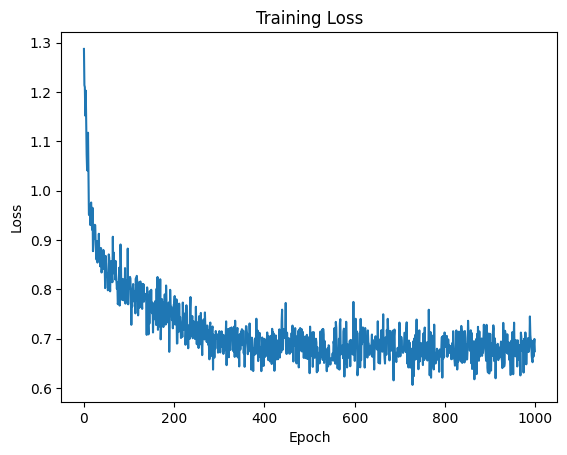

In [ ]:
class ConditionalModel(nn.Module):
    def __init__(self, dim):
        super(ConditionalModel, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(dim + 1, 128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, dim)
        )

    def forward(self, x, t):
        inputs = torch.cat([x, t[..., None].float()], dim=-1)
        return self.net(inputs)

u_net = ConditionalModel(2)
optimizer = torch.optim.Adam(u_net.parameters(), lr=1e-3)
batch_size = 1024
num_epochs = 1000

def loss_fn(x0, x1, t):
    loss = torch.mean((u_net((1 - t[:, None]) * x0 + t[:, None] * x1, t) - (x1 - x0)) ** 2)
    return loss

def train_step():
    optimizer.zero_grad()
    x0 = torch.tensor(sample_from_p0((batch_size, )), dtype=torch.float32)
    x1 = torch.tensor(sample_from_pT((batch_size, )), dtype=torch.float32)
    t = torch.rand((batch_size,), dtype=torch.float32)

    loss = loss_fn(x0, x1, t)
    loss.backward()
    optimizer.step()
    return loss.item()

losses = []
for epoch in range(num_epochs):
    loss = train_step()
    losses.append(loss)
    if epoch % 1000 == 0:
        print(f"Epoch {epoch}, Loss: {loss:.4f}")
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

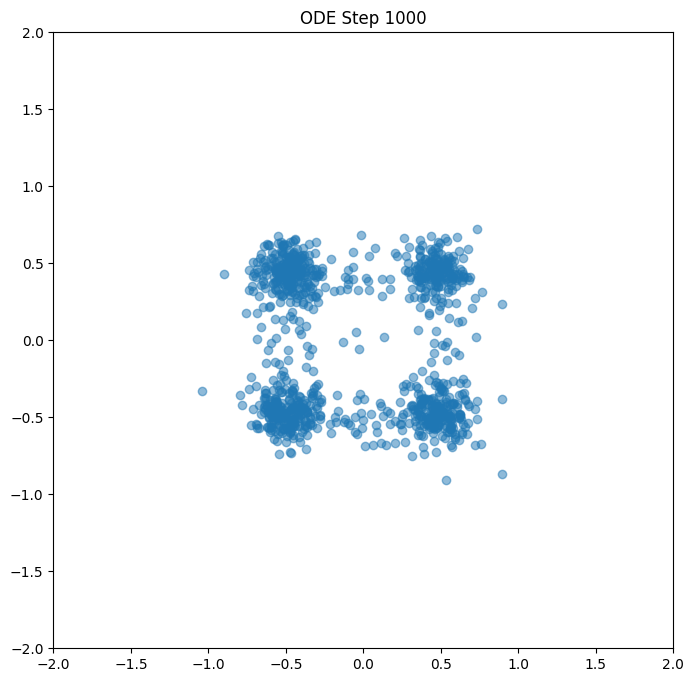

In [ ]:
def ode_step(x, t, dt):
    x_tensor = torch.tensor(x, dtype=torch.float32)
    t_tensor = torch.tensor(t, dtype=torch.float32).unsqueeze(0).expand_as(x_tensor[:, 0])
    v_pred = u_net(x_tensor, t_tensor).detach().numpy()
    return x - dt * v_pred

T = 1000
x_init = sample_from_pT((1000, ))
substep = 50

fig, ax = plt.subplots(figsize=(8, 8))
x = x_init.copy()
scat = ax.scatter(x[:, 0], x[:, 1], alpha=0.5)
ax.set_xlim(-2, 2)
ax.set_ylim(-2, 2)

def update(frame):
    global x
    scat.set_offsets(x)
    for i in range(substep):
        x = ode_step(x, 1 - (frame * substep + i + 1) / T, 1. / T)
    ax.set_title(f"ODE Step {(frame + 1) * substep}")
    return scat,

ani = FuncAnimation(fig, update, frames=T // substep, blit=True)
HTML(ani.to_jshtml())